<a href="https://colab.research.google.com/github/Ignas12345/DIPs/blob/master/MRI_sandbox.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Code for **super-resolution** (figures $1$ and $5$ from main paper).. Change `factor` to $8$ to reproduce images from fig. $9$ from supmat.

You can play with parameters and see how they affect the result.

In [ ]:
"""
*Uncomment if running on colab*
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab
"""
!git clone https://github.com/Ignas12345/DIPs.git
!mv DIPs/* ./

Cloning into 'DIPs'...
remote: Enumerating objects: 317, done.
remote: Counting objects: 100% (317/317), done.
remote: Compressing objects: 100% (148/148), done.
remote: Total 317 (delta 181), reused 285 (delta 167), pack-reused 0
Receiving objects: 100% (317/317), 68.72 MiB | 10.24 MiB/s, done.
Resolving deltas: 100% (181/181), done.
Updating files: 100% (53/53), done.


In [5]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import nn

**Read image**

In [6]:
image = plt.imread('MRI_slice_zoomed_in.jpg')
image = image[:,:,0] # make image black and white
shape = np.array([image.shape[0], image.shape[1]])

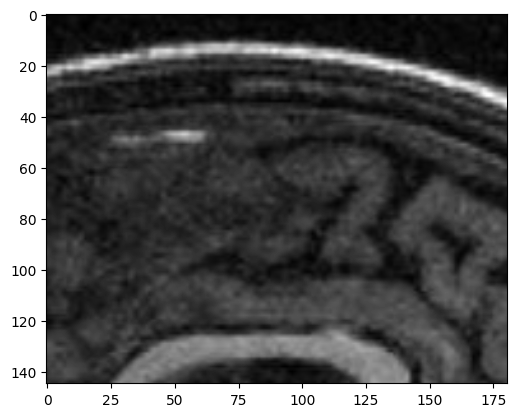

In [7]:
plt.imshow(image, cmap='gray', interpolation='bilinear')

**Noise function and factor of upscaling:**

In [8]:
def generate_noise(shape, max = 1):
    noise = np.random.random(shape) * max # max is here for images to be on the same scale as the input
    return noise

factor = 8
noise = generate_noise(shape * factor, np.max(image))


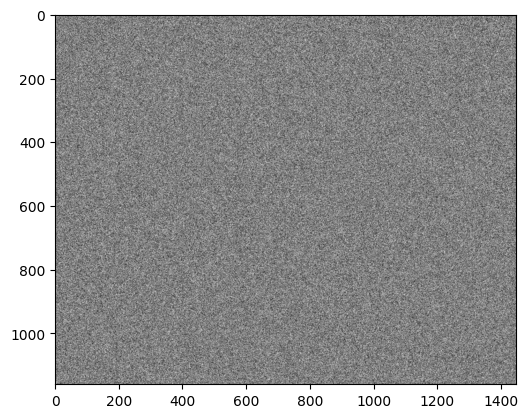

In [9]:
plt.imshow(noise, cmap='gray', interpolation='bilinear') # I still don't get why bilinear gives different results that nearest?

**First goal**: build a neural network that gets the edge map (based on code from: https://github.com/Nikronic/EdgeNet/blob/master/EdgeNet.py)

In [10]:
class CBR(nn.Module):
    def __init__(self, input_channel, output_channel):
        """
        It consists of the 5x5 convolutions with stride=1, padding=2, and a batch normalization, followed by
        a rectified linear unit (ReLU)

        :param input_channel: input channel size
        :param output_channel: output channel size
        """
        assert (input_channel > 0 and output_channel > 0)

        super(CBR, self).__init__()
        layers = [nn.Conv2d(input_channel, output_channel, kernel_size=1, stride=1, padding=2), nn.ReLU(inplace=True)]
        self.layers = nn.Sequential(*layers)

    def forward(self, x):
        return self.layers(x)

In [11]:
dtype = torch.FloatTensor
def torch_to_np(tensor):
  array = tensor.squeeze().detach().numpy()
  return array
def np_to_torch(array):
  tensor = torch.tensor(array).unsqueeze(0).type(dtype)
  return tensor

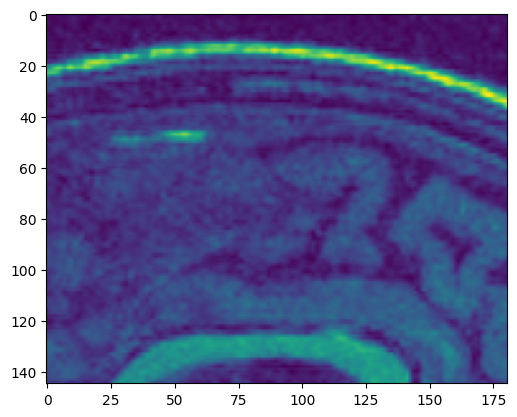

In [12]:
plt.imshow(image)

In [14]:
model = nn.Conv2d(in_channels = 1, out_channels = 1, kernel_size = 1, padding = 0, dilation = 1)
model.weight.data.fill_(1.0)

tensor([[[[1.]]]])

In [15]:
out = model(np_to_torch(image))

In [16]:
result = torch_to_np(out)

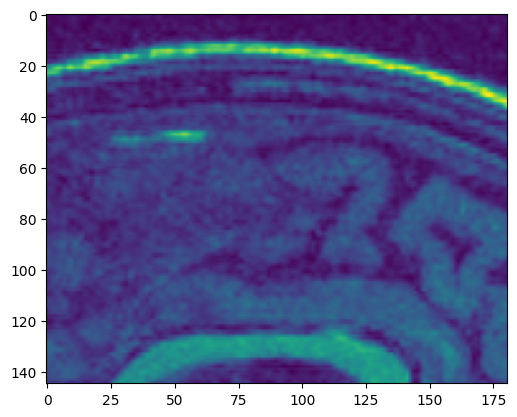

In [17]:
plt.imshow(result)

# Import libs

In [ ]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import argparse
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models import *

import torch
import torch.optim

from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from models.downsampler import Downsampler

from utils.sr_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize = -1
factor = 2 # 8
enforse_div32 = 'CROP' # we usually need the dimensions to be divisible by a power of two (32 in this case)
PLOT = True

# To produce images from the paper we took *_GT.png images from LapSRN viewer for corresponding factor,
# e.g. x4/zebra_GT.png for factor=4, and x8/zebra_GT.png for factor=8
path_to_image = 'data/sr/MRI_slice.jpg'

Noise function:

# Load image and baselines

HR and LR resolutions: (544, 544), (272, 272)


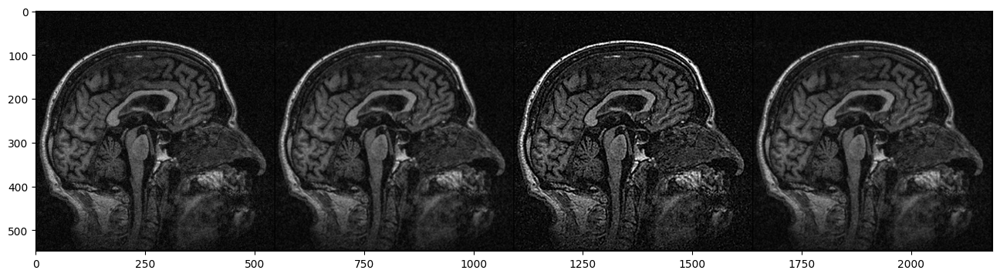

PSNR bicubic: 36.4995   PSNR nearest: 32.5373


In [ ]:
# Starts here
imgs = load_LR_HR_imgs_sr(path_to_image , imsize, factor, enforse_div32)

imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np'] = get_baselines(imgs['LR_pil'], imgs['HR_pil'])

if PLOT:
    plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np']], 4,12);
    print ('PSNR bicubic: %.4f   PSNR nearest: %.4f' %  (
                                        compare_psnr(imgs['HR_np'], imgs['bicubic_np']),
                                        compare_psnr(imgs['HR_np'], imgs['nearest_np'])))

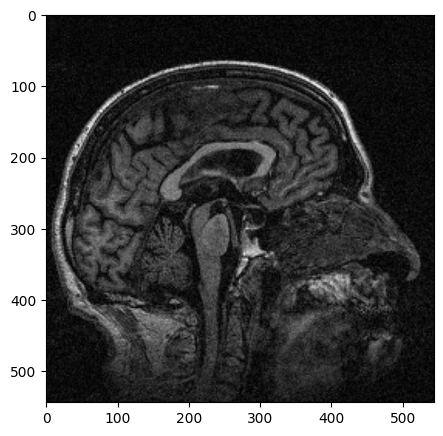

In [ ]:
plot_image_grid([imgs['HR_np']], 4, 4);

# Set up parameters and net

In [ ]:
input_depth = 32

INPUT =     'noise'
pad   =     'reflection'
OPT_OVER =  'net'
KERNEL_TYPE='lanczos2'

LR = 0.01
tv_weight = 0.0

OPTIMIZER = 'adam'

if factor == 4:
    num_iter = 2000
    reg_noise_std = 0.03
elif factor == 8:
    num_iter = 4000
    reg_noise_std = 0.05
elif factor == 2:
    num_iter = 4000
    reg_noise_std = 0.05
else:
    assert False, 'We did not experiment with other factors'

In [ ]:
net_input = get_noise(input_depth, INPUT, (factor * imgs['HR_pil'].size[1], factor * imgs['HR_pil'].size[0])).type(dtype).detach()
plot_image_grid([net_input], 4, 4);

RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

In [ ]:
net_input = get_noise(input_depth, INPUT, (factor * imgs['HR_pil'].size[1], factor * imgs['HR_pil'].size[0])).type(dtype).detach()

NET_TYPE = 'skip' # UNet, ResNet
net = get_net(input_depth, 'skip', pad,
              skip_n33d=128,
              skip_n33u=128,
              skip_n11=4,
              num_scales=5,
              upsample_mode='bilinear').type(dtype)

# Losses
mse = torch.nn.MSELoss().type(dtype)

img_LR_var = np_to_torch(imgs['HR_np']).type(dtype)

downsampler = Downsampler(n_planes=3, factor=factor, kernel_type=KERNEL_TYPE, phase=0.5, preserve_size=True).type(dtype)

# Define closure and optimize

In [ ]:
def closure():
    global i, net_input

    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out_HR = net(net_input)
    out_LR = downsampler(out_HR)

    total_loss = mse(out_LR, img_LR_var)

    if tv_weight > 0:
        total_loss += tv_weight * tv_loss(out_HR)

    total_loss.backward()

    # Log
    psnr_LR = compare_psnr(imgs['HR_np'], torch_to_np(out_LR))
    print ('Iteration %05d    PSNR_LR %.3f ' % (i, psnr_LR), '\r', end='')
    #psnr_HR = compare_psnr(imgs['HR_np'], torch_to_np(out_HR))
    #print ('Iteration %05d    PSNR_LR %.3f   PSNR_HR %.3f' % (i, psnr_LR, psnr_HR), '\r', end='')

    # History
    #psnr_history.append([psnr_LR, psnr_HR])
    psnr_history.append([psnr_LR])

    if PLOT and i % 100 == 0:
        out_HR_np = torch_to_np(out_HR)
        #plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], np.clip(out_HR_np, 0, 1)], factor=13, nrow=3)
        plot_image_grid([imgs['HR_np']], 4, 4);
        print('super resolution: ')
        plot_image_grid([np.clip(out_HR_np, 0, 1)], 4, 4);

    i += 1

    return total_loss

Starting optimization with ADAM


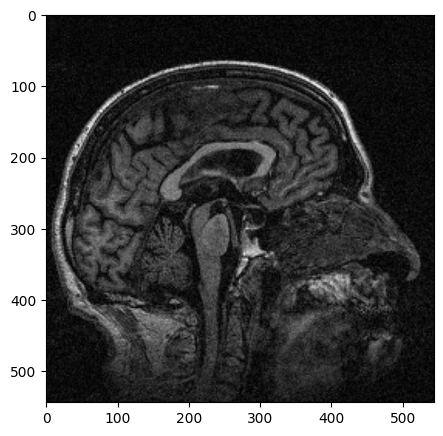

super resolution: 


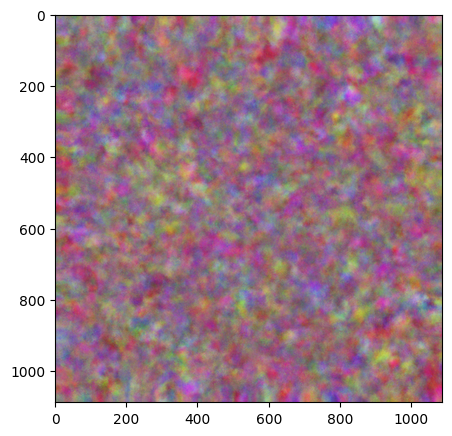

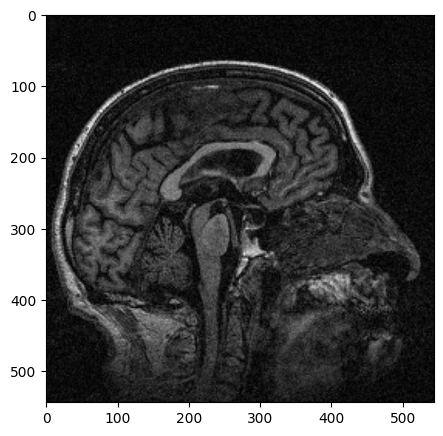

super resolution: 


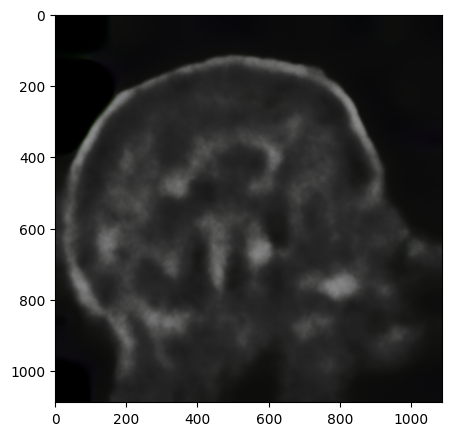

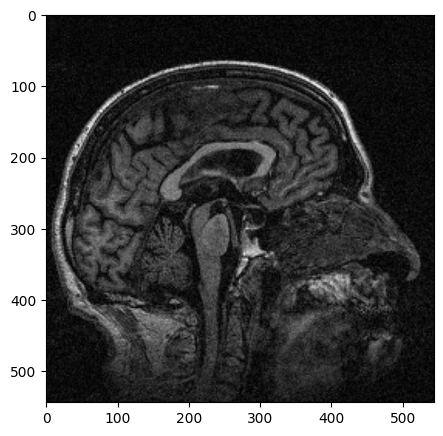

super resolution: 


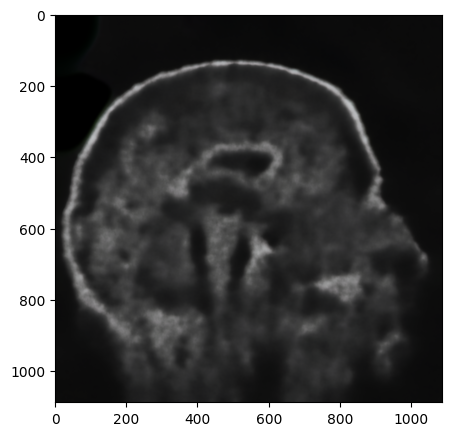

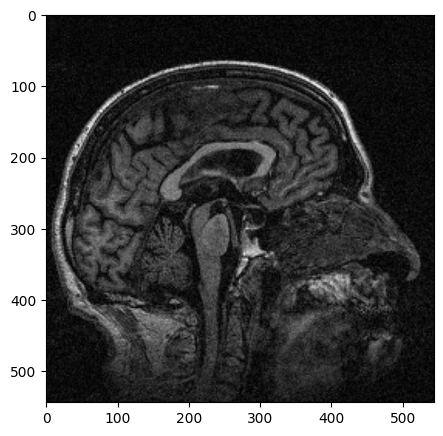

super resolution: 


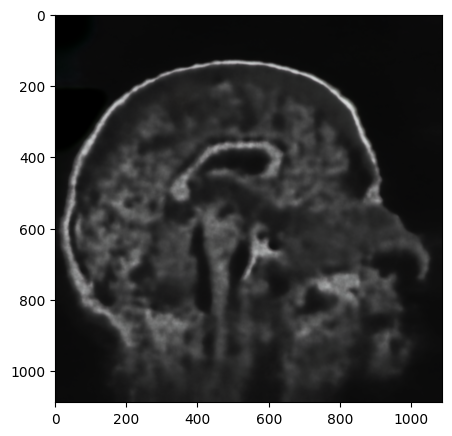

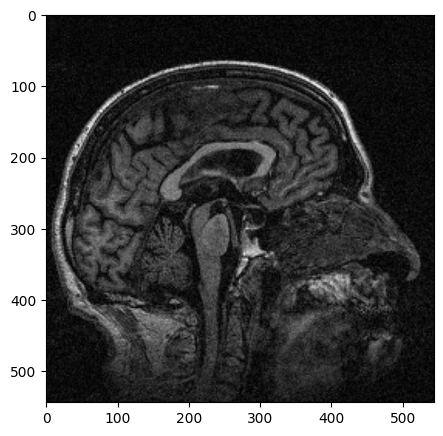

super resolution: 


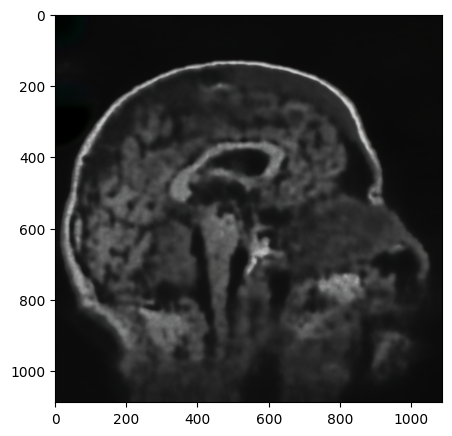

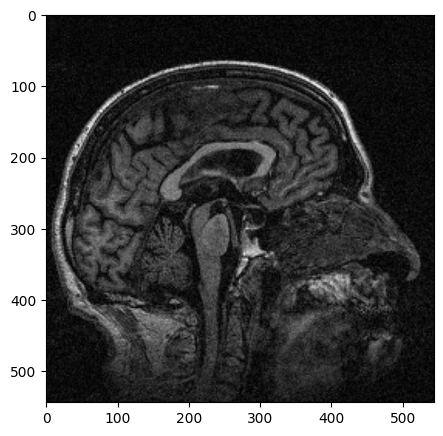

super resolution: 


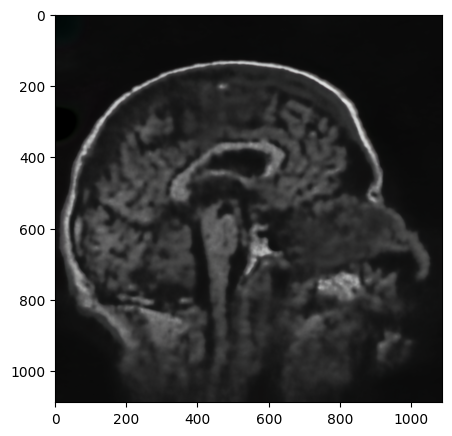

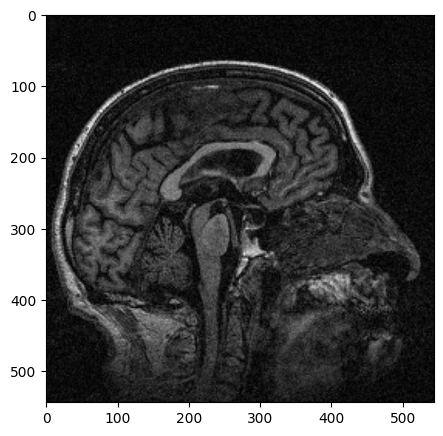

super resolution: 


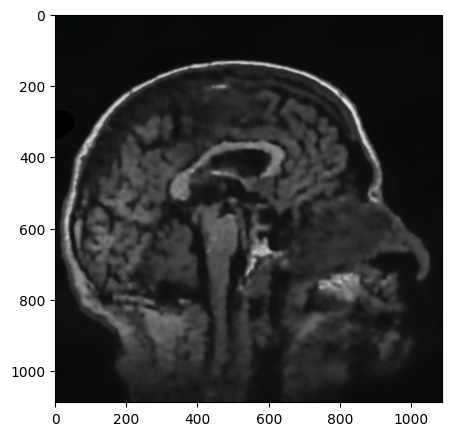

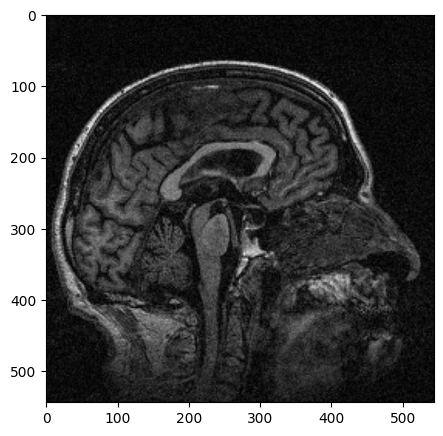

super resolution: 


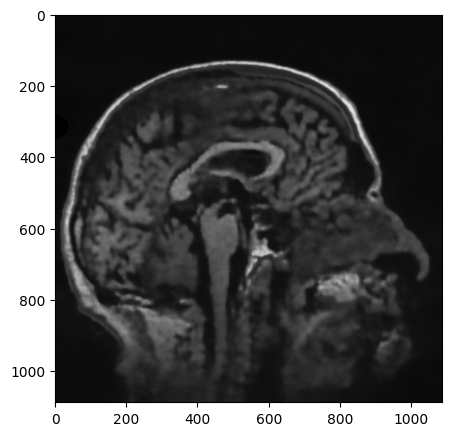

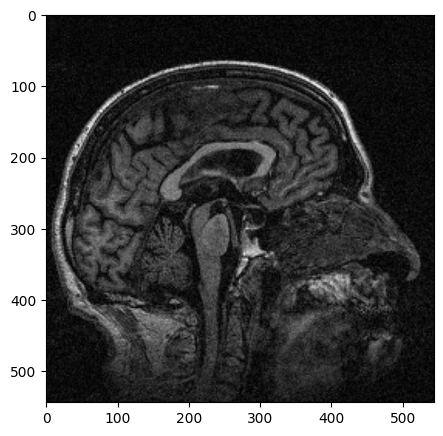

super resolution: 


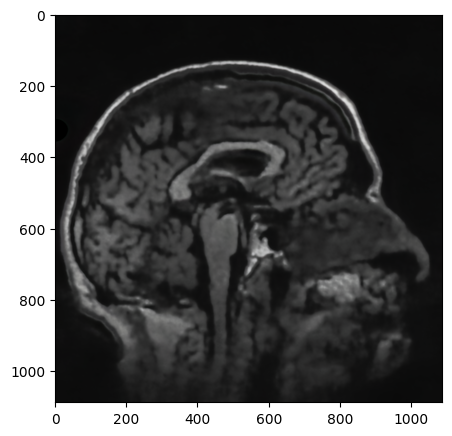

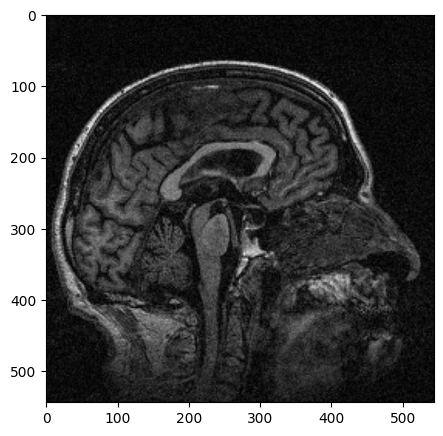

super resolution: 


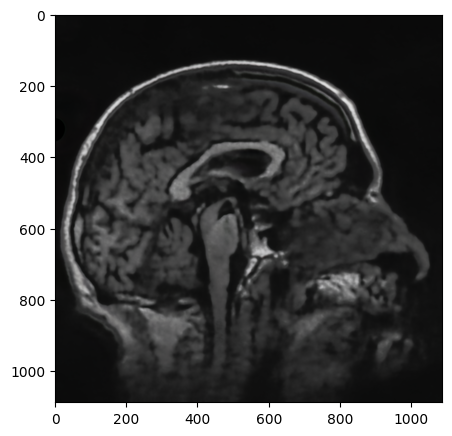

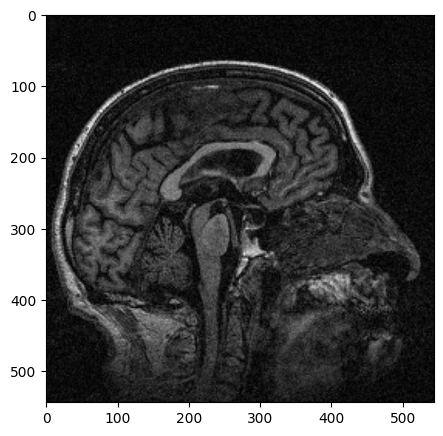

super resolution: 


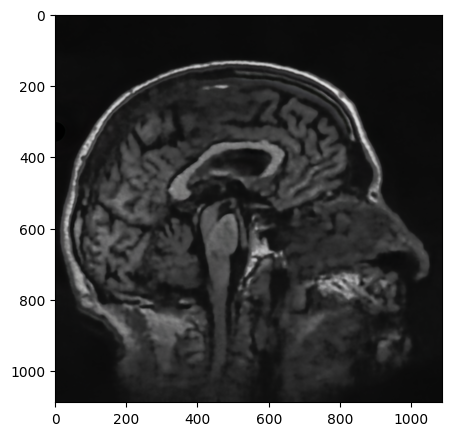

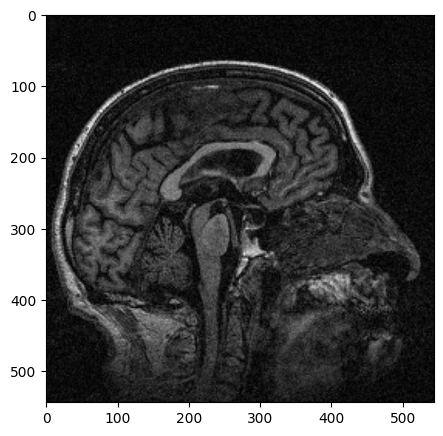

super resolution: 


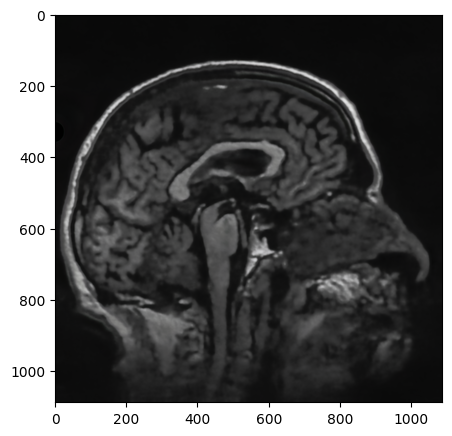

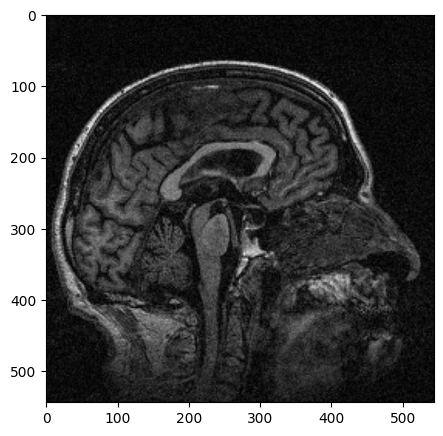

super resolution: 


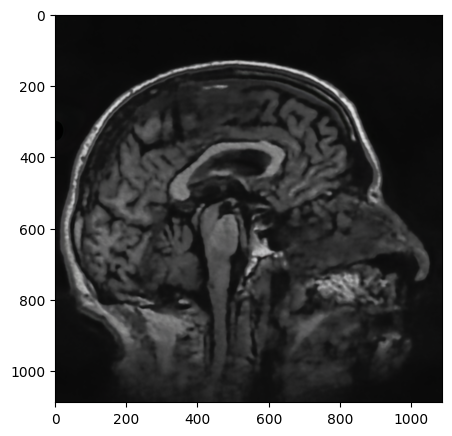

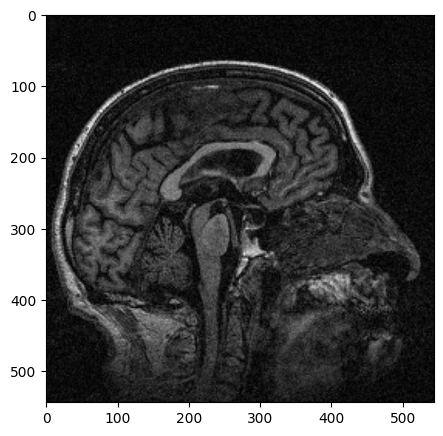

super resolution: 


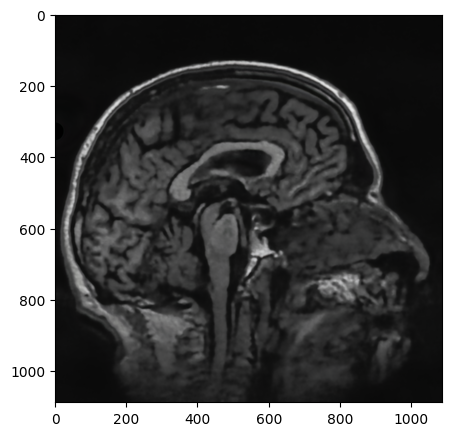

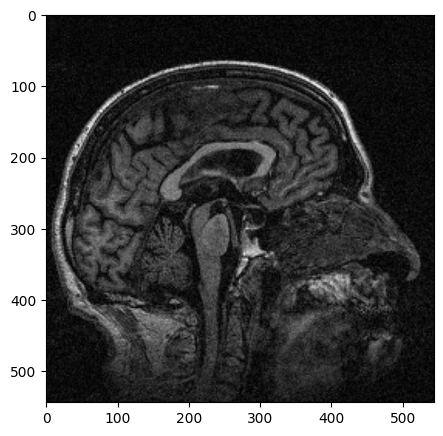

super resolution: 


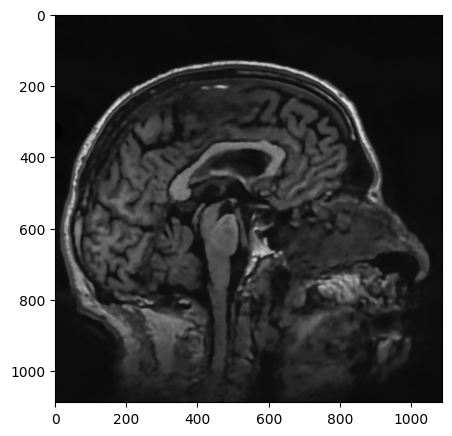

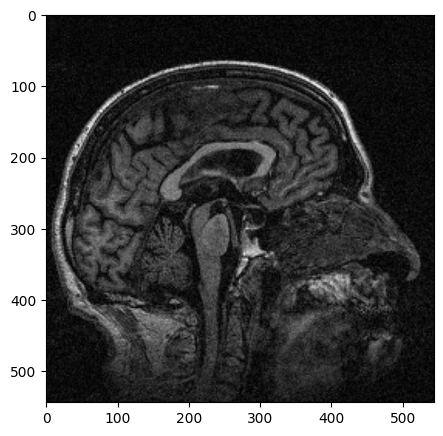

super resolution: 


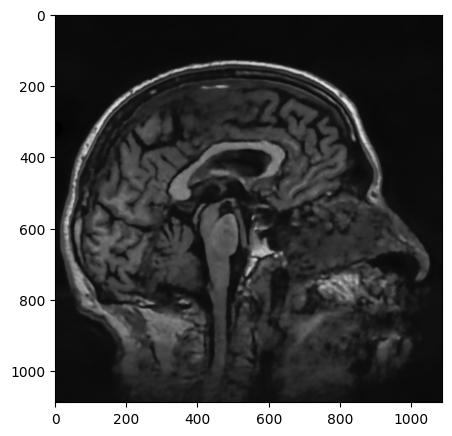

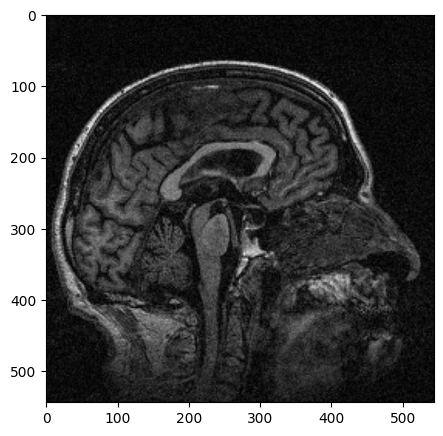

super resolution: 


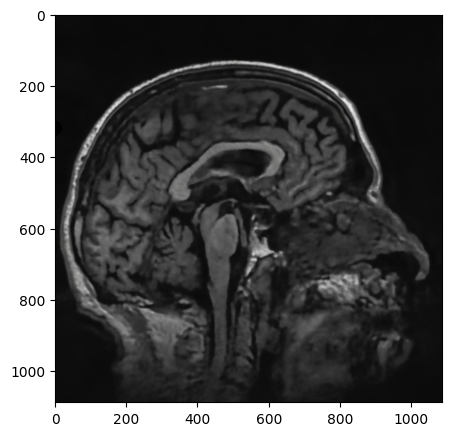

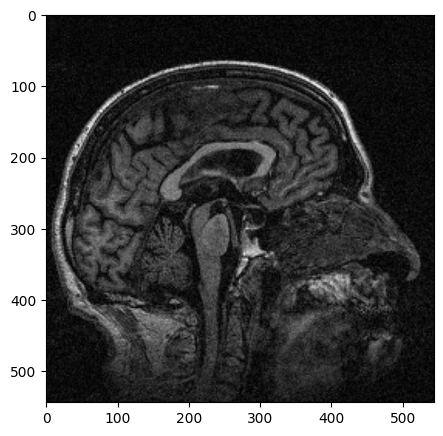

super resolution: 


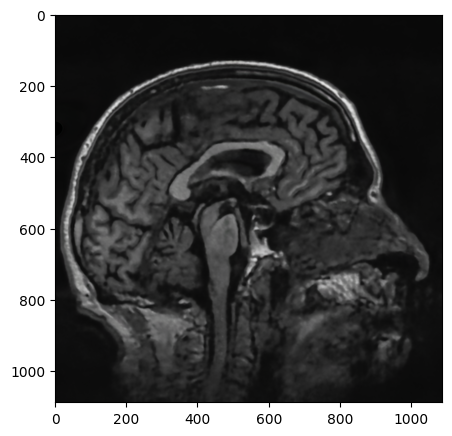

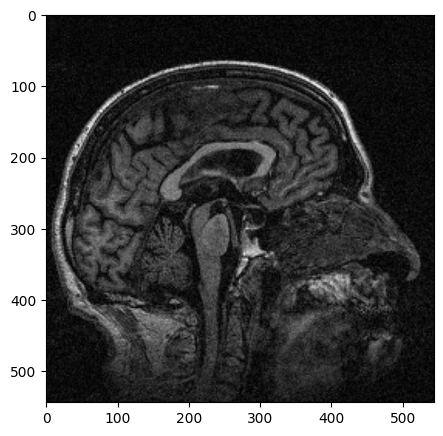

super resolution: 


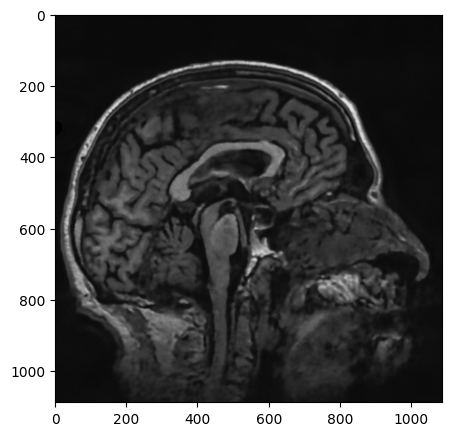

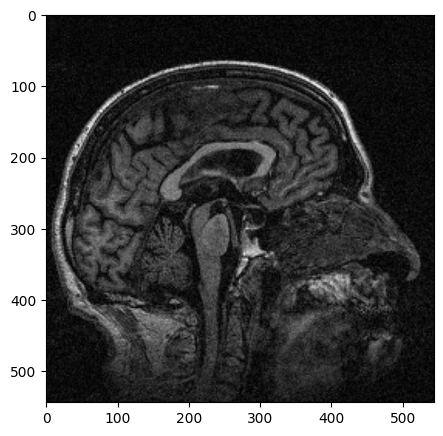

super resolution: 


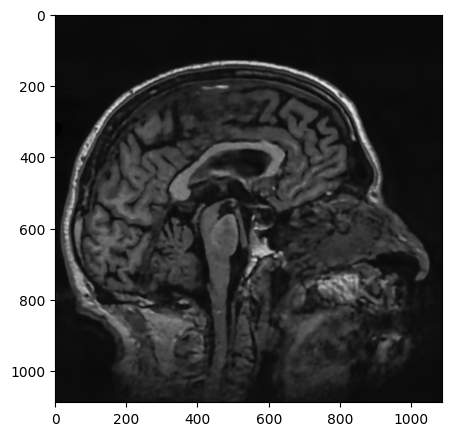

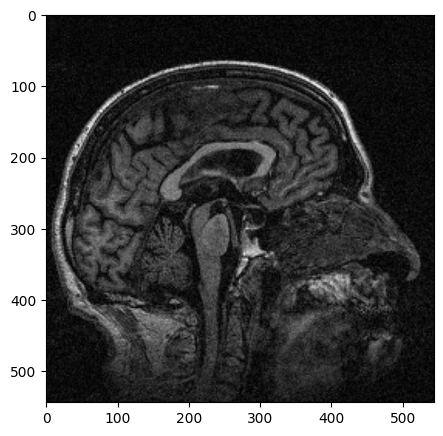

super resolution: 


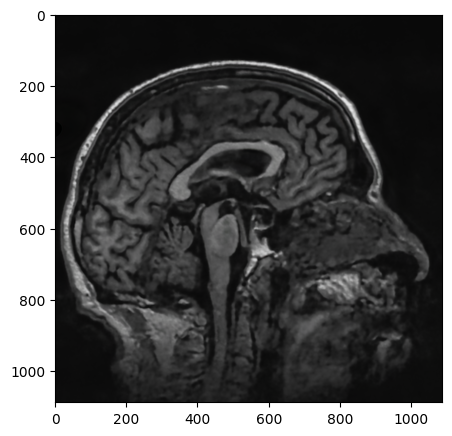

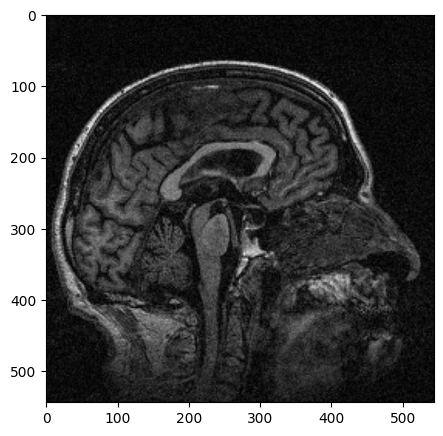

super resolution: 


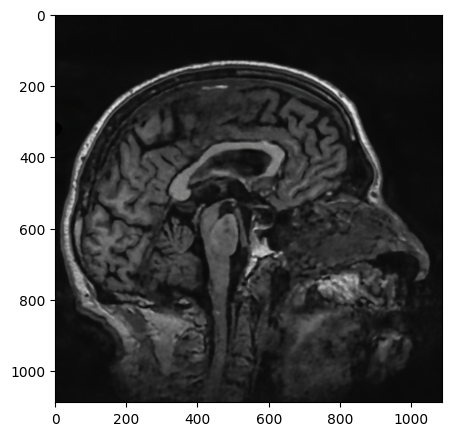

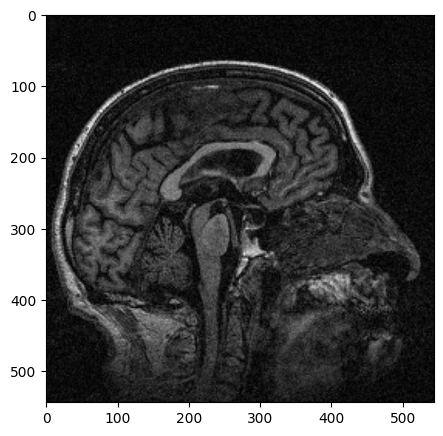

super resolution: 


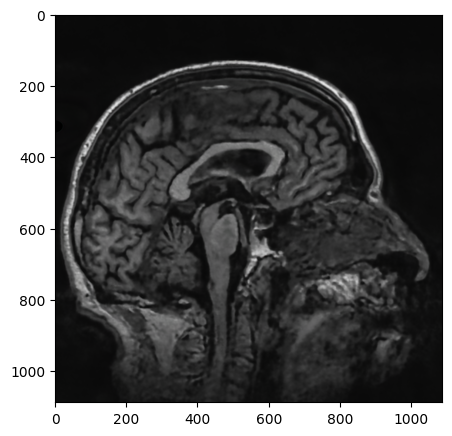

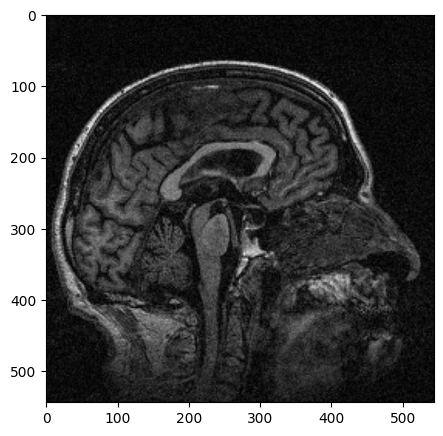

super resolution: 


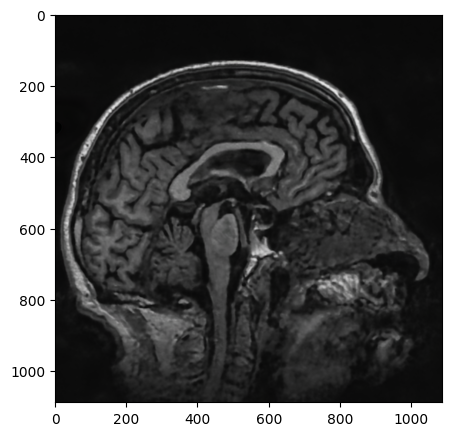

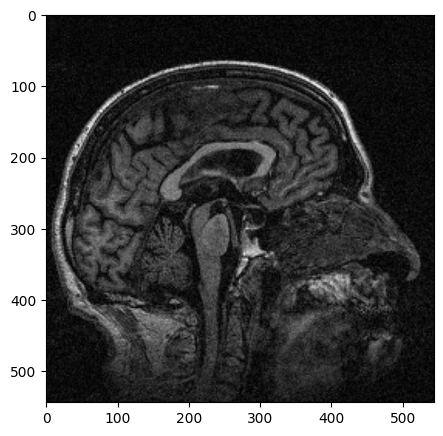

super resolution: 


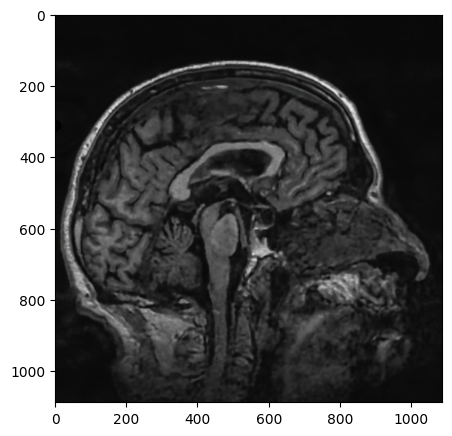

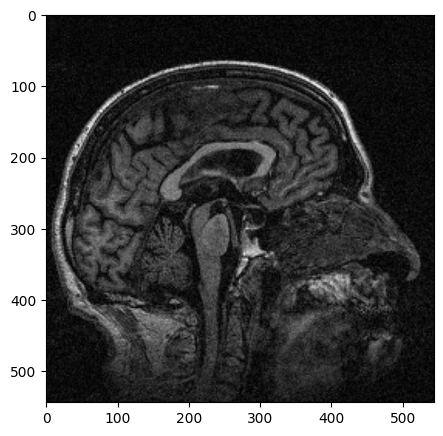

super resolution: 


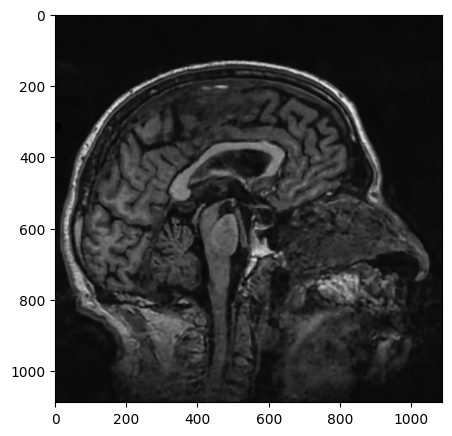

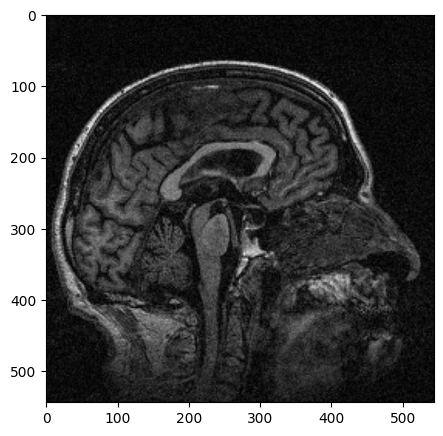

super resolution: 


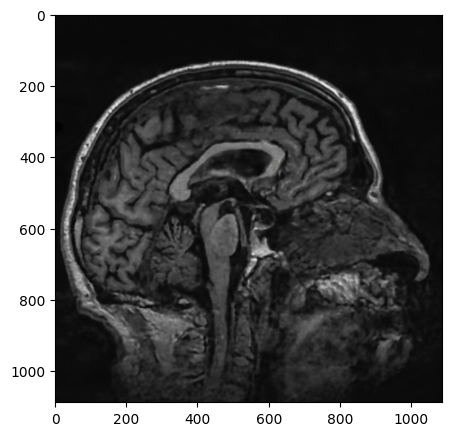

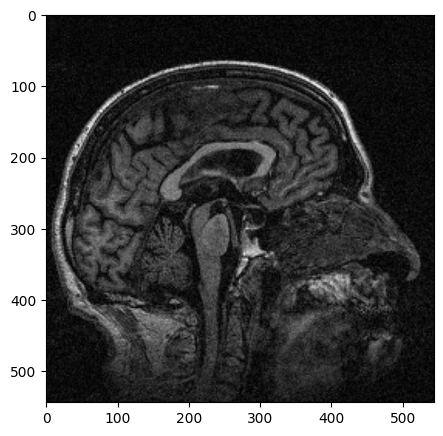

super resolution: 


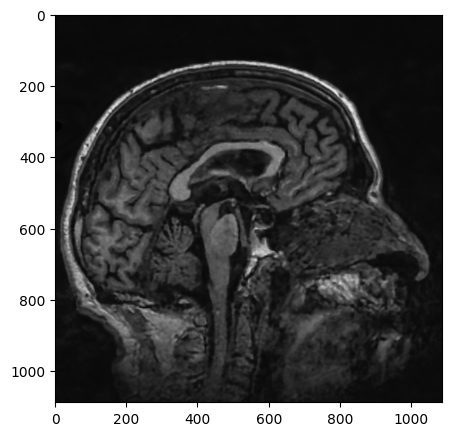

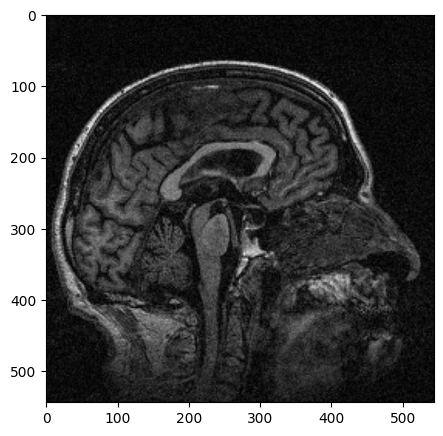

super resolution: 


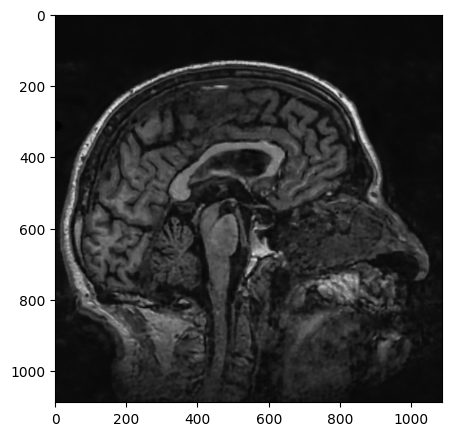

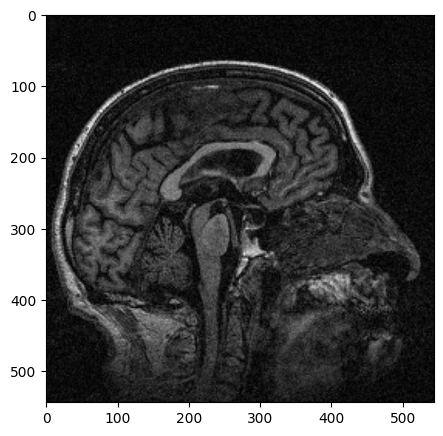

super resolution: 


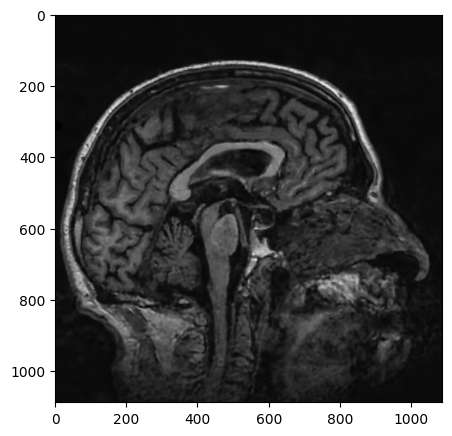

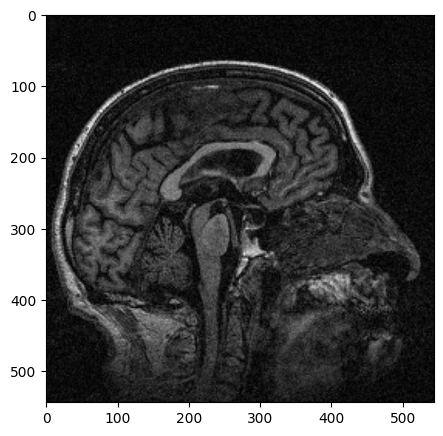

super resolution: 


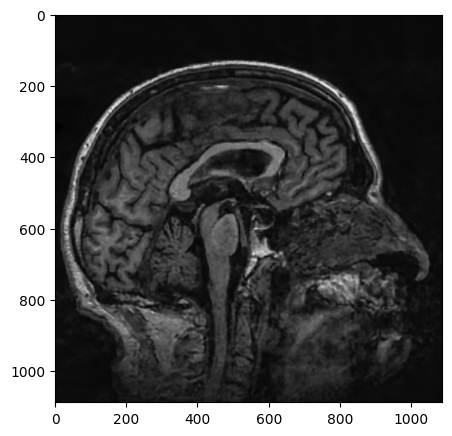

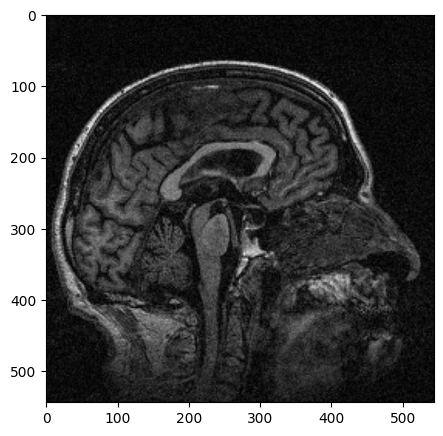

super resolution: 


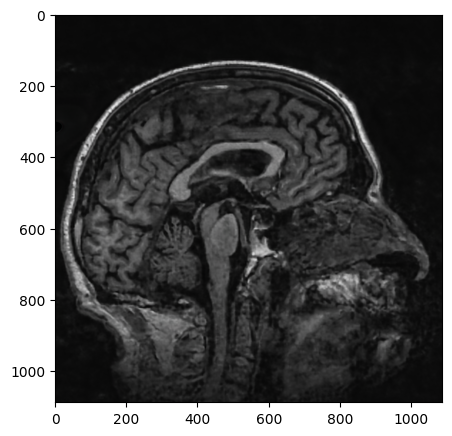

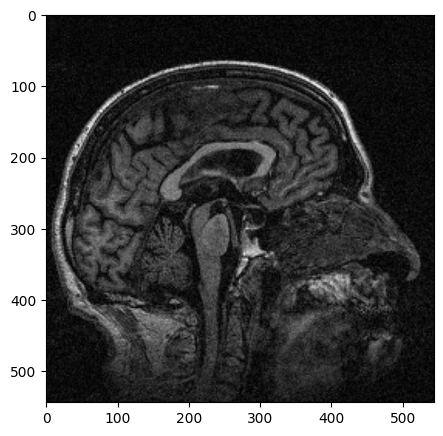

super resolution: 


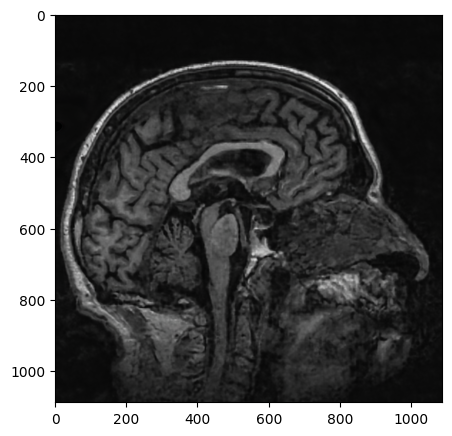

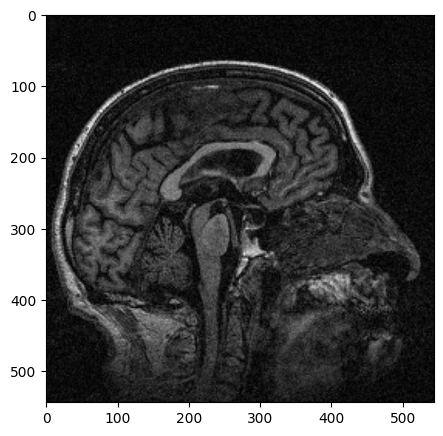

super resolution: 


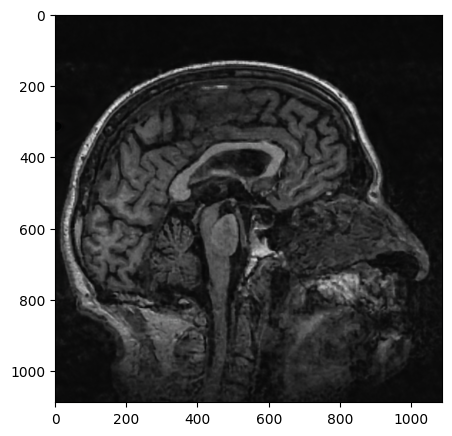

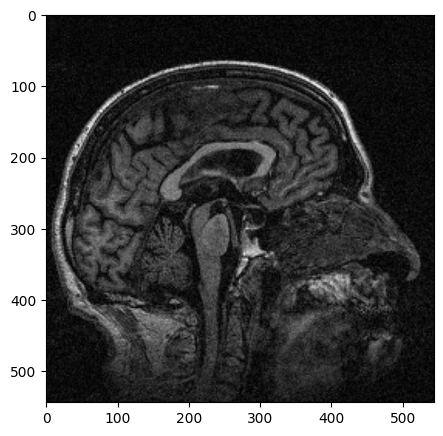

super resolution: 


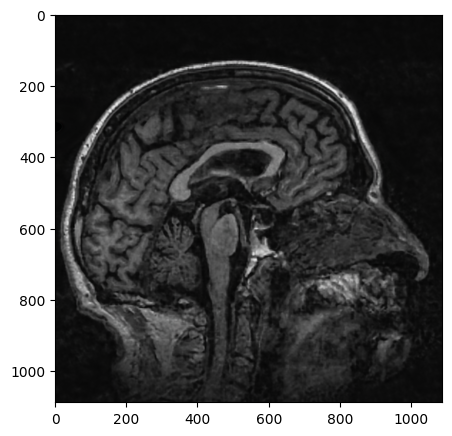

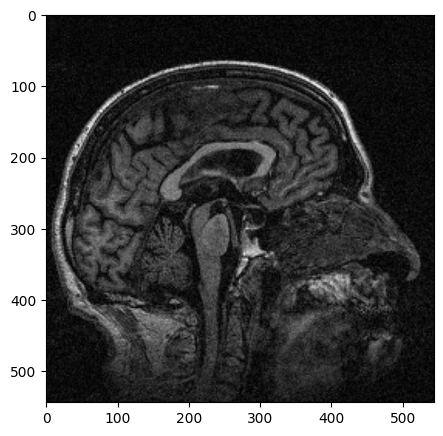

super resolution: 


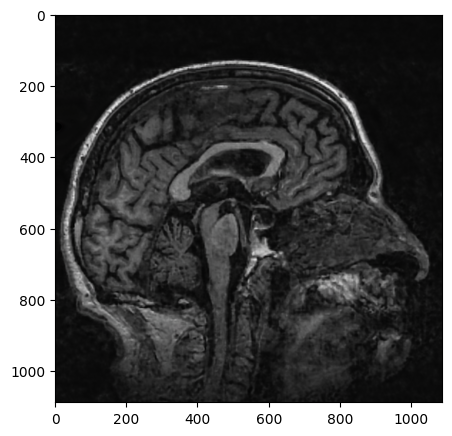

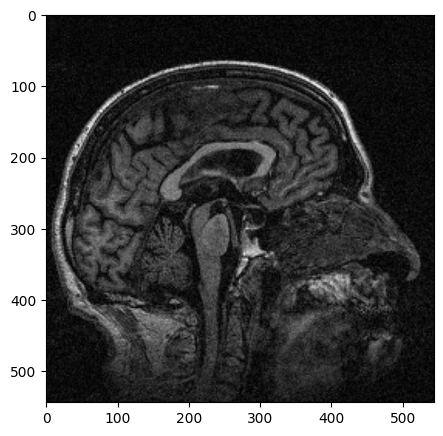

super resolution: 


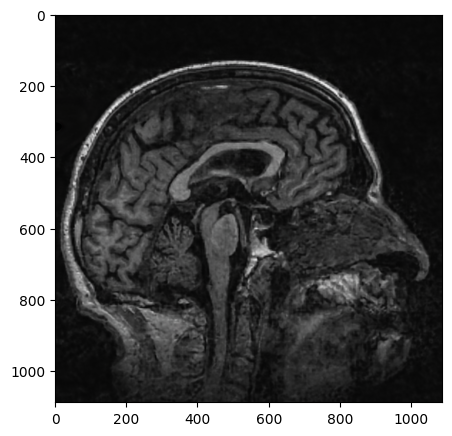

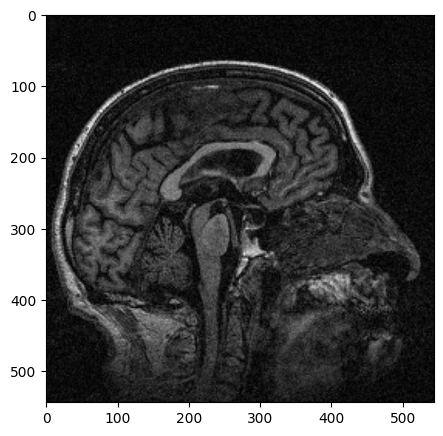

super resolution: 


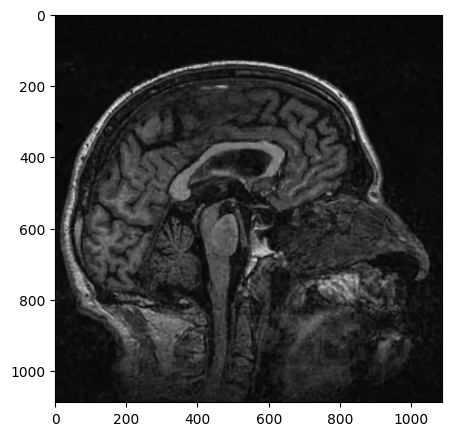

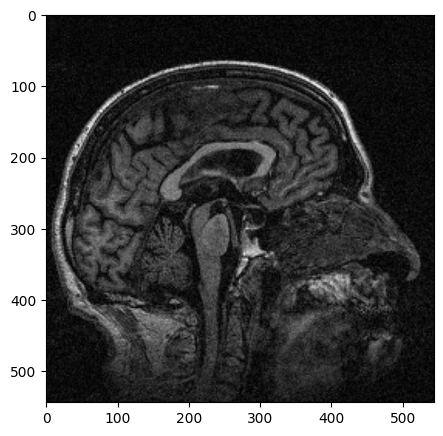

super resolution: 


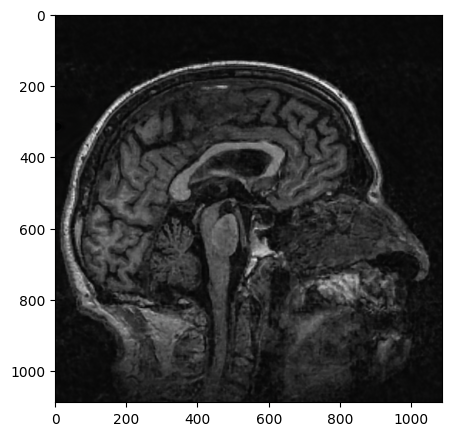

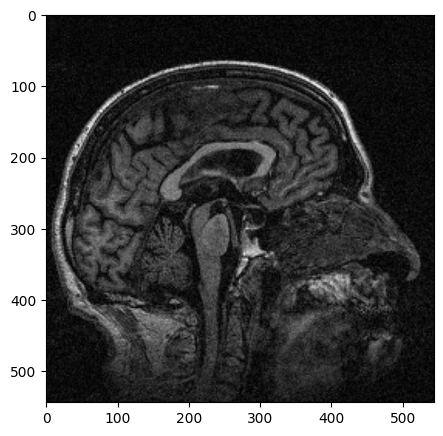

super resolution: 


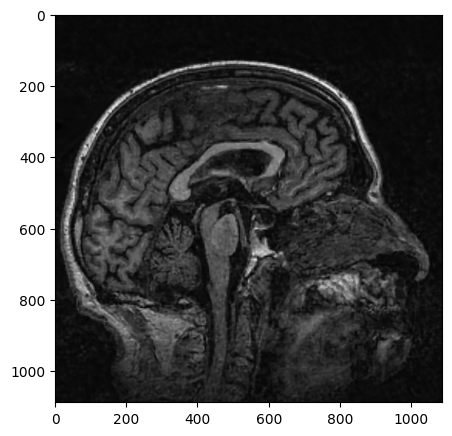

In [ ]:
psnr_history = []
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

i = 0
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

In [ ]:
out_HR_np = np.clip(torch_to_np(net(net_input)), 0, 1)

In [ ]:
out_HR_pil = np_to_pil(out_HR_np)

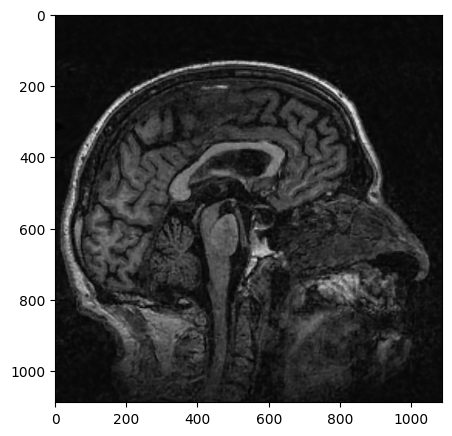

array([[[0.03981253, 0.04175257, 0.04007741, ..., 0.03077898,
         0.03239565, 0.03257327],
        [0.03961823, 0.04021664, 0.03976886, ..., 0.03136978,
         0.03349712, 0.03332701],
        [0.03952815, 0.03990107, 0.03964417, ..., 0.03196877,
         0.03525444, 0.03444003],
        ...,
        [0.0390647 , 0.03883068, 0.03748465, ..., 0.03430411,
         0.03219098, 0.03466664],
        [0.04059571, 0.03954954, 0.03821518, ..., 0.0336069 ,
         0.03323562, 0.03392275],
        [0.041028  , 0.03966897, 0.03878944, ..., 0.03405728,
         0.03280445, 0.03392736]],

       [[0.03964718, 0.04179555, 0.04034247, ..., 0.03075686,
         0.03260482, 0.03259123],
        [0.03957708, 0.04040223, 0.0400182 , ..., 0.03130097,
         0.03362075, 0.03335558],
        [0.03943698, 0.03993209, 0.03976067, ..., 0.03207091,
         0.03541432, 0.03439857],
        ...,
        [0.03912991, 0.03844973, 0.03771208, ..., 0.03398594,
         0.03213366, 0.03481991],
        [0.0

In [ ]:
plot_image_grid([out_HR_np], 4, 4)